In [1]:
import matplotlib.pyplot as plt
from spider import SPIDER
op = SPIDER()
import anndata
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np


2023-06-16 20:14:05.294892: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-06-16 20:14:05.296909: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-16 20:14:05.336292: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-16 20:14:05.337367: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-16 20:14:06.114670: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [2]:
import importlib
importlib.metadata.version('spider-st')

'0.1.19'

In [4]:
ds = 'mouse_lung'
sample_name = 'D2'
out_f = f'../example_datasets/{ds}/{sample_name}/'
adata = anndata.read_h5ad(f'{out_f}/adata.h5ad')

In [ ]:
no_spatalk = False
if len(adata) > 10000:
    no_spatalk=True
idata = op.prep(adata, out_f, R_path, cluster_key=adata.uns['cluster_key'], is_human=adata.uns['is_human'], coord_type=adata.uns['coord_type'], no_spatalk=no_spatalk)
idata, meta_idata = op.find_svi(idata, out_f, R_path, alpha=0.3)
idata.write_h5ad(f'{out_f}/idata.h5ad')

In [5]:
idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')

metrics

Using the results from SVI identification methods: ['SOMDE' 'SpatialDE' 'SPARKX' 'nnSVG' 'scGCO' 'gearyC' 'moranI']
304/1919 SVIs identified (threshold=0.01).
evaluating with ['moranI' 'gearyC' 'SOMDE' 'nnSVG']
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Geary
C (rev.)_SVI vs. Geary
C (rev.)_Excluded: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.081e-96 U_stat=4.301e+05
Moran
I_SVI vs. Moran
I_Excluded: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.281e-96 U_stat=4.301e+05
FSV
(SOMDE)_SVI vs. FSV
(SOMDE)_Excluded: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.028e-23 U_stat=3.339e+05
LR
(SOMDE)_SVI vs. LR
(SOMDE)_Excluded: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.345e-92 U_stat=4.264e+05
LR
(nnSVG)_SVI vs. L

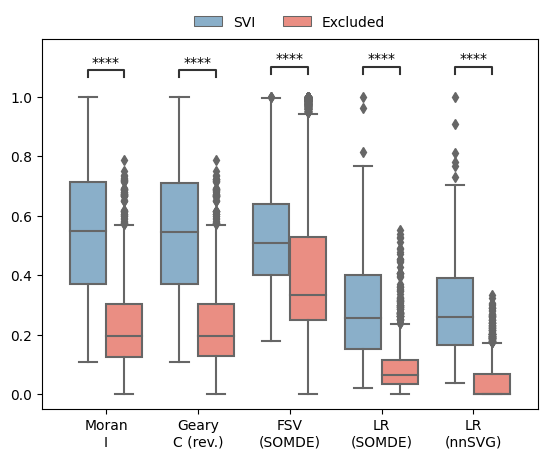

In [6]:
svi_df, svi_df_strict = op.svi.combine_SVI(idata,threshold=0.01)
op.svi.eva_SVI(idata, svi_df_strict)
plt.savefig(f'../figures/{ds}_{sample_name}_metric.png', dpi=300,bbox_inches='tight')

100%|██████████| 1000/1000 [08:01<00:00,  2.08/s]


Mouse KEGG_2019_Mouse
Using mouse LR pair dataset.
50
0.43591512826098433 0.2796481028527321 0.1888163639613563


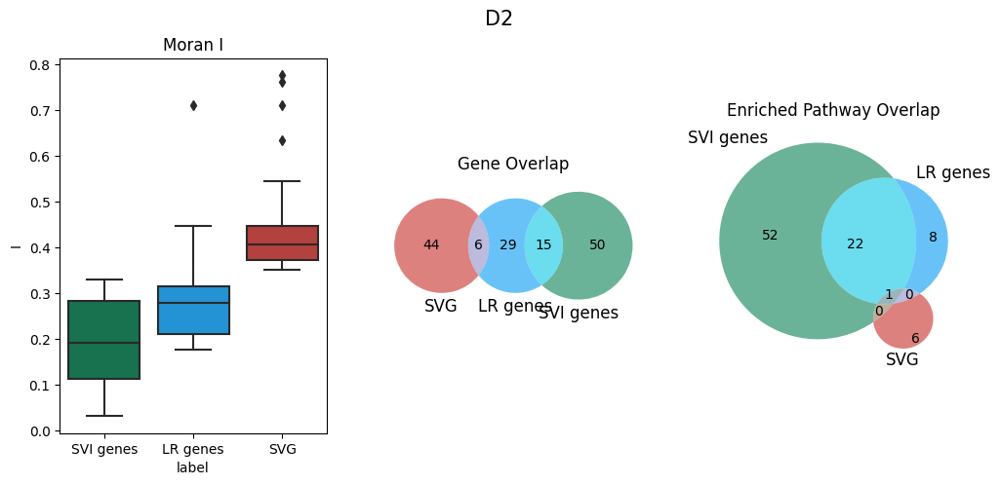

In [7]:
op.util.adata_moranI(adata, out_f=out_f)
merged_df,lri_pw_list,gene_lr_list,gene_pw_list = op.vis.svg_svi_relation(adata, idata, title=sample_name, is_human=adata.uns['is_human'], top=50)
plt.savefig(f'../figures/{ds}_{sample_name}_relation.png', dpi=600,bbox_inches='tight')

In [8]:
import gseapy
membership=pd.get_dummies(merged_df.set_index('Term')['group']).groupby('Term').sum().astype(str).agg('-'.join, axis=1).reset_index()
for x in membership[0].unique():
    sub_df = merged_df[merged_df.Term.isin(membership[membership[0]==x].Term)]
    if len(sub_df.Term.unique())>20:
        ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=20, figsize=(3,8),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}.png')
    elif len(sub_df.Term.unique())>10:
        ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=20, figsize=(3,6),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}.png')
    elif len(sub_df.Term.unique())<5:
        ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=30, figsize=(3,8),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}_large.png')
        ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=100, figsize=(3,1),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}_small.png')
    else:
        ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=10, figsize=(3,8),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}_large.png')
        ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=50, figsize=(3,2),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}_small.png')

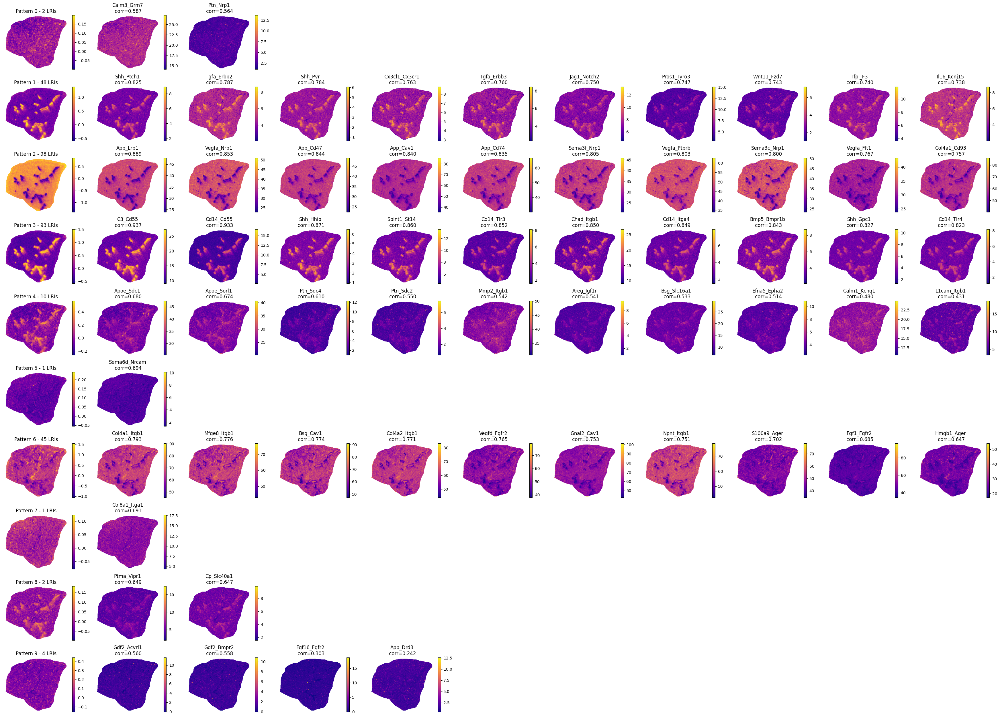

In [9]:
op.vis.pattern_LRI(idata,show_SVI=10, spot_size=1)
plt.tight_layout()
plt.savefig(f'../figures/{ds}_{sample_name}_patterns.png', dpi=600,bbox_inches='tight')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

9_no vs. 9_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.387e-09 U_stat=0.000e+00
0_no vs. 0_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.313e-05 U_stat=0.000e+00
1_no vs. 1_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.733e-84 U_stat=5.350e+02
2_no vs. 2_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.185e-168 U_stat=6.610e+02
3_no vs. 3_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.868e-111 U_stat=2.503e+03
4_no vs. 4_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.642e-19 U_stat=9.500e+01
5_no vs. 5_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correcti

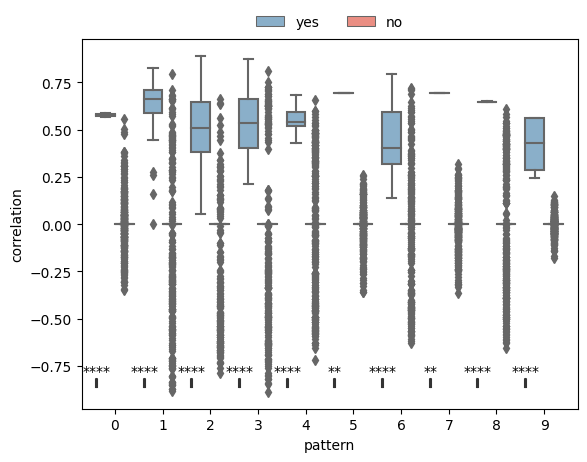

In [10]:
op.svi.eva_pattern(idata)
plt.savefig(f'../figures/{ds}_{sample_name}_pattern_metric.png', dpi=600,bbox_inches='tight')


In [11]:
idata = idata[:, idata.var['is_svi']==1]

In [12]:
adata, adata_lri, adata_pattern = op.cell_transform(idata, adata, label=adata.uns['cluster_key'])

Added key cell_pattern in idata.uns
Added key cell_score in idata.uns
Added key interaction_pattern, interaction_score in adata.obsm
Added key rank_interaction_score_groups, rank_interaction_pattern_groups in adata.uns


         Falling back to preprocessing with `sc.pp.pca` and default params.


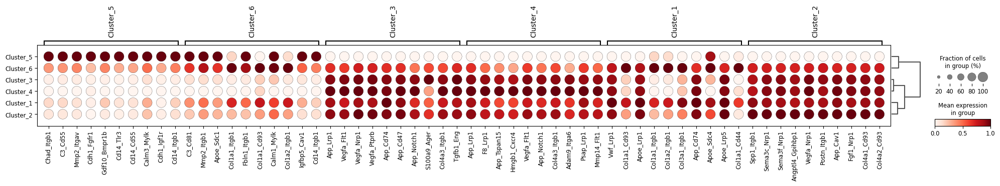

In [13]:
with plt.rc_context():
    sc.pl.rank_genes_groups_dotplot(adata_lri, standard_scale='var', show=False)
    plt.savefig(f'../figures/{ds}_{sample_name}_label_SVI.png', bbox_inches="tight")

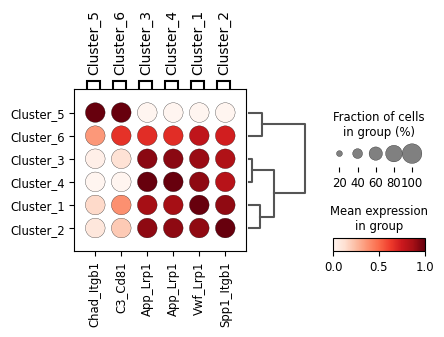

In [14]:
with plt.rc_context():
    sc.pl.rank_genes_groups_dotplot(adata_lri, standard_scale='var', n_genes=1, show=False)
    plt.savefig(f'../figures/{ds}_{sample_name}_label_SVI1.png', bbox_inches="tight")

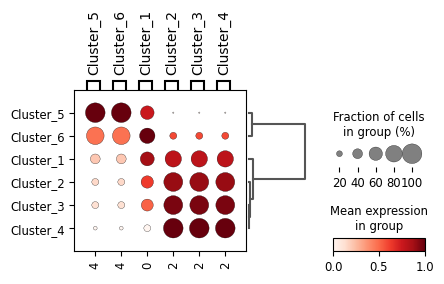

In [15]:
with plt.rc_context(): 
    sc.pl.rank_genes_groups_dotplot(adata_pattern, standard_scale='var', n_genes=1, show=False)
    plt.savefig(f'../figures/{ds}_{sample_name}_label_pattern.png', bbox_inches="tight")


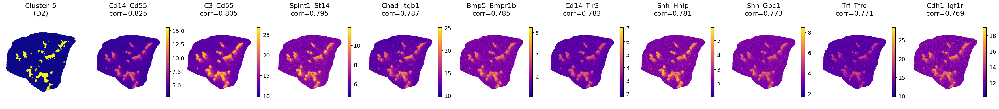

In [26]:
from scipy import stats
pds = []
for i in adata_lri.var_names:
    pds.append(pd.get_dummies(adata.obs['annotation']).corrwith(adata_lri.to_df()[i].astype('float'), method=stats.pointbiserialr)[:1])
pds_df = pd.concat(pds)
pds_df.index = adata_lri.var_names
adata.obs[['row', 'col']] = adata.obs[['row', 'col']].astype(int)
useful_df = []
plt.rcParams.update({'font.size': 14})
for cluster_i in adata.obs['annotation'].unique():
    df_sub = pds_df[pds_df[cluster_i]>0.5][cluster_i].sort_values(ascending=False)
    if len(df_sub) > 0:
        useful_df.append(df_sub)
        markers = df_sub.index.to_numpy()[:10]
        corrs = df_sub.values[:10]
        cluster_name = df_sub.name
        plt.figure(figsize=(4*(len(markers)+1), 4))
        base = 1
        plt.subplot(1, len(markers)+1, base)

        plt.scatter(adata.obs['row'],adata.obs['col'], c=adata.obs['annotation']==cluster_i, s=0.5, cmap='plasma')
        plt.axis('equal')
        plt.axis('off')
        plt.title(f'{cluster_name}\n({sample_name})')
        base += 1

        marker_score = adata_lri.to_df()[markers]
        marker_score = pd.concat([adata_lri.obs[['row', 'col']], marker_score], axis=1)
        for i in range(len(markers)):
            plt.subplot(1, len(markers)+1, base)
            im=plt.scatter(marker_score['row'],marker_score['col'], c=marker_score[markers[i]], s=0.5, cmap='plasma')
            plt.colorbar(im,fraction=0.046, pad=0.04)
            plt.axis('equal')
            plt.axis('off')
            plt.title(f'{markers[i]}\ncorr={"%.3f" % corrs[i]}')
            base += 1
        plt.savefig(f'../figures/{ds}_{sample_name}_{cluster_name}.png', dpi=300,bbox_inches='tight')

In [17]:
arr = []
for cluster_i in adata.obs['annotation'].unique():
    df_sub = pds_df[pds_df[cluster_i]>0.5][cluster_i].sort_values(ascending=False)
    for j in df_sub.index:
        arr.append([cluster_i, j])
celltype_lris = pd.DataFrame(arr, columns=['celltype', 'lri']).set_index('lri')
merged_df, arr = op.er.enrichment_interacrtion_gene_df(celltype_lris, groupby='celltype',  is_human=False)
merged_df = merged_df[merged_df['Adjusted P-value'] < 0.05]
merged_df[merged_df.Term.str.contains('adhesion')]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,celltype,ordered_celltype
5,KEGG_2019_Mouse,Focal adhesion,16/199,2.000088e-13,5.200230e-12,0,0,15.233232,445.426017,ITGB1;LAMA5;ITGA4;LAMA2;ITGB4;CAV1;ITGA2;LAMC2...,Cluster_5,Cluster_5
8,KEGG_2019_Mouse,Cell adhesion molecules (CAMs),14/170,5.006878e-12,8.678588e-11,0,0,15.385173,400.325406,ITGB1;ITGA4;SDC4;SDC2;SDC3;ITGB2;PTPRM;L1CAM;P...,Cluster_5,Cluster_5


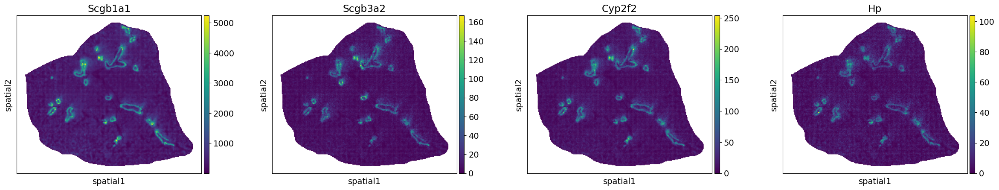

In [18]:
adata.obsm['spatial'] = adata.obsm['spatial'].astype(int)
sc.pl.spatial(adata, color=['Scgb1a1', 'Scgb3a2', 'Cyp2f2', 'Hp'], spot_size=1.5)

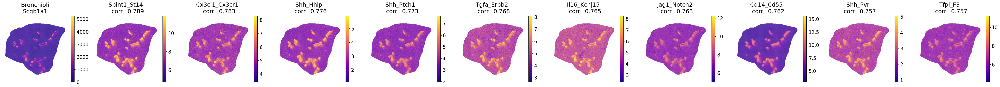

In [19]:
corr_df = pd.concat([adata.to_df()[['Scgb1a1', 'Scgb3a2', 'Cyp2f2', 'Hp']].loc[adata_lri.obs_names], adata_lri.to_df()], axis=1).corr(method='pearson')
corr_df_asyn =  corr_df.loc[adata_lri.var_names, ['Scgb1a1', 'Scgb3a2', 'Cyp2f2', 'Hp']]
plt.rcParams.update({'font.size': 15})

corrs = corr_df_asyn.mean(1).sort_values(ascending=False).values[:10]
lris = corr_df_asyn.mean(1).sort_values(ascending=False).index[:10]
marker_score = adata_lri.to_df()[lris]
adata.obs[['row', 'col']] = adata.obs[['row', 'col']].astype(int)
adata_lri.obs[['row', 'col']] = adata_lri.obs[['row', 'col']].astype(int)

plt.figure(figsize=(44, 4))
base=1
plt.subplot(1, 11, base)
im=plt.scatter(adata.obs['row'],adata.obs['col'], c=adata.to_df()['Scgb1a1'], s=0.05, cmap='plasma',vmin=0)
plt.colorbar(im,fraction=0.046, pad=0.04)
plt.axis('equal')
plt.axis('off')
plt.title('Bronchioli\nScgb1a1')
base+=1
for i in range(len(lris)):
    plt.subplot(1, 11, base)
    im=plt.scatter(adata_lri.obs['row'],adata_lri.obs['col'], c=marker_score[lris[i]], s=0.05, cmap='plasma')
    plt.colorbar(im,fraction=0.046, pad=0.04)
    plt.axis('equal')
    plt.axis('off')
    plt.title(f'{lris[i]} \n corr={"%.3f" % corrs[i]}')
    base += 1
plt.tight_layout()
plt.savefig(f'../figures/{ds}_{sample_name}_BronchioliMarker.png', dpi=600,bbox_inches='tight')

In [20]:
decon = pd.read_csv(f'{out_f}/decon.csv', index_col=0)
corr_df = pd.concat([decon.T, adata_lri.to_df().loc[decon.columns]], axis=1).corr(method='pearson')
corr_df_asyn =  corr_df.loc[adata_lri.var_names, decon.index]
mask = corr_df_asyn.loc[corr_df_asyn.idxmax()].to_numpy().diagonal() > 0.3
decon_meta = pd.concat([decon.T, adata_lri.obs.loc[decon.columns]], axis=1)
decon_meta[['row', 'col']] = decon_meta[['row', 'col']].astype(int)

In [21]:
corr_df_asyn.loc[corr_df_asyn.idxmax()[mask], corr_df_asyn.idxmax()[mask].index]

,Adventitial Fibroblast,Alveolar Fibroblast,Ciliated
Col1a1_Itgb1,0.359339,-0.177670,0.085492
Fn1_Itga3,-0.148156,0.331211,-0.407077
C3_Cd55,0.068300,-0.267983,0.716132


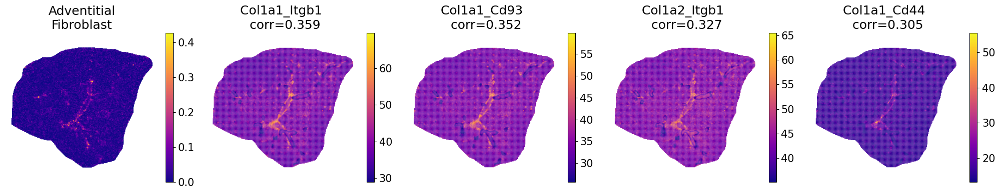

In [22]:
plt.rcParams.update({'font.size': 15})

corrs = corr_df_asyn[corr_df_asyn['Adventitial Fibroblast']>0.3]['Adventitial Fibroblast'].sort_values(ascending=False).values[:10]
lris = corr_df_asyn[corr_df_asyn['Adventitial Fibroblast']>0.3]['Adventitial Fibroblast'].sort_values(ascending=False).index[:10]
marker_score = adata_lri.to_df().loc[decon.columns, lris]

plt.figure(figsize=(44, 4))
base=1
plt.subplot(1, 11, base)
cell_meta_sub=decon_meta[decon_meta['Adventitial Fibroblast']>0].sort_values('Adventitial Fibroblast')
im=plt.scatter(decon_meta['row'],decon_meta['col'], c=decon_meta['Adventitial Fibroblast'], s=1, cmap='plasma',vmin=0, edgecolors='none')
plt.scatter(cell_meta_sub['row'],cell_meta_sub['col'], c=cell_meta_sub['Adventitial Fibroblast'], s=3, cmap='plasma',vmin=0, edgecolors='none')
plt.colorbar(im,fraction=0.046, pad=0.04)
plt.axis('equal')
plt.axis('off')
plt.title(f'Adventitial\nFibroblast')
base+=1
for i in range(len(lris)):
    plt.subplot(1, 11, base)
    im=plt.scatter(decon_meta['row'],decon_meta['col'], c=marker_score[lris[i]], s=1, cmap='plasma', edgecolors='none')
    plt.colorbar(im,fraction=0.046, pad=0.04)
    plt.axis('equal')
    plt.axis('off')
    plt.title(f'{lris[i]} \n corr={"%.3f" % corrs[i]}')
    base += 1
plt.tight_layout()
plt.savefig(f'../figures/{ds}_{sample_name}_AdventitialFibroblast.png', dpi=600,bbox_inches='tight')

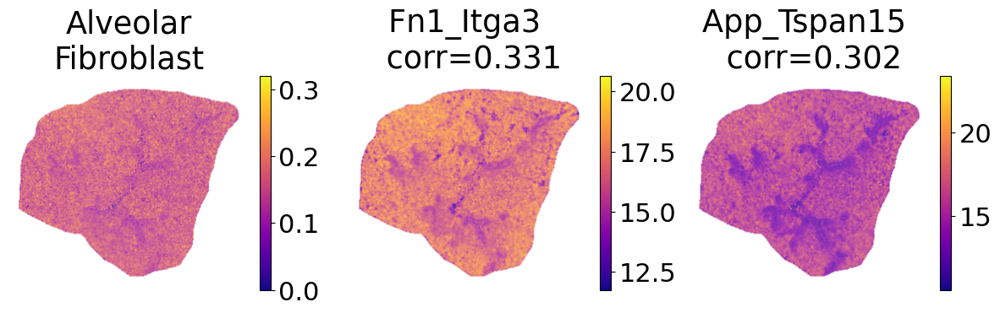

In [23]:
plt.rcParams.update({'font.size': 22})

corrs = corr_df_asyn[corr_df_asyn['Alveolar Fibroblast']>0.3]['Alveolar Fibroblast'].sort_values(ascending=False).values[:10]
lris = corr_df_asyn[corr_df_asyn['Alveolar Fibroblast']>0.3]['Alveolar Fibroblast'].sort_values(ascending=False).index[:10]
marker_score = adata_lri.to_df().loc[decon.columns, lris]

plt.figure(figsize=(44, 4))
base=1
plt.subplot(1, 11, base)
im=plt.scatter(decon_meta['row'],decon_meta['col'], c=decon_meta['Alveolar Fibroblast'], s=0.05, cmap='plasma',vmin=0)
plt.colorbar(im,fraction=0.046, pad=0.04)
plt.axis('equal')
plt.axis('off')
plt.title(f'Alveolar\nFibroblast')
base+=1
for i in range(len(lris)):
    plt.subplot(1, 11, base)
    im=plt.scatter(decon_meta['row'],decon_meta['col'], c=marker_score[lris[i]], s=0.05, cmap='plasma')
    plt.colorbar(im,fraction=0.046, pad=0.04)
    plt.axis('equal')
    plt.axis('off')
    plt.title(f'{lris[i]} \n corr={"%.3f" % corrs[i]}')
    base += 1
plt.tight_layout()
plt.savefig(f'../figures/{ds}_{sample_name}_AlveolarFibroblast.png', dpi=600,bbox_inches='tight')

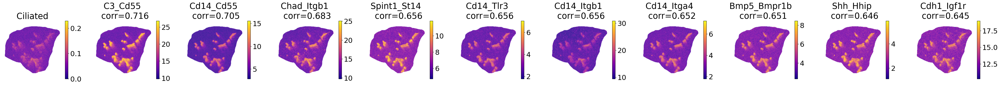

In [24]:
plt.rcParams.update({'font.size': 22})

corrs = corr_df_asyn[corr_df_asyn['Ciliated']>0.3]['Ciliated'].sort_values(ascending=False).values[:10]
lris = corr_df_asyn[corr_df_asyn['Ciliated']>0.3]['Ciliated'].sort_values(ascending=False).index[:10]
marker_score = adata_lri.to_df().loc[decon.columns, lris]

plt.figure(figsize=(44, 4))
base=1
plt.subplot(1, 11, base)
im=plt.scatter(decon_meta['row'],decon_meta['col'], c=decon_meta['Ciliated'], s=0.05, cmap='plasma',vmin=0)
plt.colorbar(im,fraction=0.046, pad=0.04)
plt.axis('equal')
plt.axis('off')
plt.title(f'Ciliated')
base+=1
for i in range(len(lris)):
    plt.subplot(1, 11, base)
    im=plt.scatter(decon_meta['row'],decon_meta['col'], c=marker_score[lris[i]], s=0.05, cmap='plasma')
    plt.colorbar(im,fraction=0.046, pad=0.04)
    plt.axis('equal')
    plt.axis('off')
    plt.title(f'{lris[i]} \n corr={"%.3f" % corrs[i]}')
    base += 1
plt.tight_layout()
plt.savefig(f'../figures/{ds}_{sample_name}_Ciliated.png', dpi=600,bbox_inches='tight')

In [25]:
arr = []
for cluster_i in corr_df_asyn.columns:
    df_sub = corr_df_asyn[corr_df_asyn[cluster_i]>0.3][cluster_i].sort_values(ascending=False)
    for j in df_sub.index:
        arr.append([cluster_i, j])
celltype_lris = pd.DataFrame(arr, columns=['celltype', 'lri']).set_index('lri')
merged_df, arr = op.er.enrichment_interacrtion_gene_df(celltype_lris, groupby='celltype',  is_human=False)
merged_df[merged_df['celltype']=='Adventitial Fibroblast']

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,celltype,ordered_celltype
0,KEGG_2019_Mouse,ECM-receptor interaction,4/83,1.373998e-09,3.984595e-08,0,0,1008.405063,20577.050828,COL1A1;ITGB1;COL1A2;CD44,Adventitial Fibroblast,Adventitial Fibroblast
1,KEGG_2019_Mouse,Proteoglycans in cancer,4/203,5.111211e-08,7.411255e-07,0,0,397.909548,6680.600671,COL1A1;ITGB1;COL1A2;CD44,Adventitial Fibroblast,Adventitial Fibroblast
2,KEGG_2019_Mouse,Platelet activation,3/125,2.361533e-06,2.282816e-05,0,0,244.340164,3165.719885,COL1A1;ITGB1;COL1A2,Adventitial Fibroblast,Adventitial Fibroblast
3,KEGG_2019_Mouse,Focal adhesion,3/199,9.561469e-06,6.932065e-05,0,0,151.522959,1751.267396,COL1A1;ITGB1;COL1A2,Adventitial Fibroblast,Adventitial Fibroblast
4,KEGG_2019_Mouse,PI3K-Akt signaling pathway,3/357,5.491577e-05,2.721312e-04,0,0,83.224576,816.408960,COL1A1;ITGB1;COL1A2,Adventitial Fibroblast,Adventitial Fibroblast
5,KEGG_2019_Mouse,Human papillomavirus infection,3/360,5.630301e-05,2.721312e-04,0,0,82.512605,807.366248,COL1A1;ITGB1;COL1A2,Adventitial Fibroblast,Adventitial Fibroblast
6,KEGG_2019_Mouse,Protein digestion and absorption,2/90,1.984964e-04,8.223420e-04,0,0,150.810606,1285.621178,COL1A1;COL1A2,Adventitial Fibroblast,Adventitial Fibroblast
7,KEGG_2019_Mouse,AGE-RAGE signaling pathway in diabetic complic...,2/101,2.500134e-04,8.873096e-04,0,0,133.979798,1111.227915,COL1A1;COL1A2,Adventitial Fibroblast,Adventitial Fibroblast
8,KEGG_2019_Mouse,Amoebiasis,2/106,2.753719e-04,8.873096e-04,0,0,127.506410,1045.219504,COL1A1;COL1A2,Adventitial Fibroblast,Adventitial Fibroblast
9,KEGG_2019_Mouse,Relaxin signaling pathway,2/131,4.202923e-04,1.218848e-03,0,0,102.666667,798.188163,COL1A1;COL1A2,Adventitial Fibroblast,Adventitial Fibroblast
